# T6.2 Surya Namaskar Step Counter

Dependencies installation

In [1]:
!pip install mediapipe==0.10.20

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.5 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of jax to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of jax to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of opencv-contrib-python to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 41.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 66.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.2/295.2 kB 23.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 71.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.2/81.2 MB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.1/69.1 MB 11.0 MB/s eta 0:00:00
  A

In [1]:
!pip uninstall -y tensorflow tensorflow-cpu tensorflow-gpu tensorflow-estimator
!pip uninstall -y mediapipe protobuf

!pip install mediapipe==0.10.20 protobuf==4.25.3

Found existing installation: tensorflow 2.20.0
Uninstalling tensorflow-2.20.0:
  Successfully uninstalled tensorflow-2.20.0
Found existing installation: mediapipe 0.10.20
Uninstalling mediapipe-0.10.20:
  Successfully uninstalled mediapipe-0.10.20
Found existing installation: protobuf 4.25.9
Uninstalling protobuf-4.25.9:
  Successfully uninstalled protobuf-4.25.9
  Using cached mediapipe-0.10.20-cp312-cp312-manylinux_2_28_x86_64.whl.metadata (9.7 kB)
Using cached mediapipe-0.10.20-cp312-cp312-manylinux_2_28_x86_64.whl (35.6 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 6.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ydf-tf 2.20.0 requires tensorflow==2.20.0, which is not installed.
opentelemetry-proto 1.38.0 requires protobuf<7.0,>=5.0, but you have protobuf 4.25.3 which is incompatible.
grpc-google-iam-v1 0.14.4 requires p

In [1]:
import mediapipe as mp

print(mp.__version__)

mp_pose = mp.solutions.pose
mp_drawing = mp.solutions.drawing_utils

print("MediaPipe working ✅")

0.10.20
MediaPipe working ✅


## DATASET

In [2]:
from google.colab import files
uploaded = files.upload()

Saving suryanamaskar.zip to suryanamaskar.zip


In [3]:
!unzip suryanamaskar.zip

Archive:  suryanamaskar.zip
   creating: suryanamaskar/
   creating: suryanamaskar/uttanasana/
  inflating: suryanamaskar/uttanasana/10-0.png  
  inflating: suryanamaskar/uttanasana/45-0.png  
  inflating: suryanamaskar/uttanasana/22-0.png  
  inflating: suryanamaskar/uttanasana/19-0.png  
  inflating: suryanamaskar/uttanasana/84-1.png  
  inflating: suryanamaskar/uttanasana/66-1.png  
  inflating: suryanamaskar/uttanasana/74-0.png  
  inflating: suryanamaskar/uttanasana/92-0.png  
  inflating: suryanamaskar/uttanasana/33-0.png  
  inflating: suryanamaskar/uttanasana/11-0.png  
  inflating: suryanamaskar/uttanasana/82-0.png  
  inflating: suryanamaskar/uttanasana/56-0.png  
  inflating: suryanamaskar/uttanasana/39-0.png  
  inflating: suryanamaskar/uttanasana/20-0.png  
  inflating: suryanamaskar/uttanasana/60-0.png  
  inflating: suryanamaskar/uttanasana/9-0.png  
  inflating: suryanamaskar/uttanasana/89-0.png  
  inflating: suryanamaskar/uttanasana/77-0.png  
  inflating: suryanamask

## POSE ESTIMATION THROUGH WEBCAM OR THROUGH GIVEN PICTURES

In [4]:
import cv2
import mediapipe as mp
import numpy as np
import os
import joblib
from collections import deque, Counter

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report


In [5]:
import numpy as np

#function for angle calc between three pts on body
def calculate_angle(a, b, c):
    a, b, c = np.array(a), np.array(b), np.array(c)

    radians = np.arctan2(c[1]-b[1], c[0]-b[0]) - \
              np.arctan2(a[1]-b[1], a[0]-b[0])

    angle = np.abs(radians * 180.0 / np.pi)
    return 360 - angle if angle > 180 else angle

# to extract features from pose landmarks

def extract_features(landmarks):
  #storing x and y coordinates
    coords = np.array([[lm.x, lm.y] for lm in landmarks])
#calc for hip shoulder
    hip_center = (coords[23] + coords[24]) / 2
    coords -= hip_center
    shoulder_dist = np.linalg.norm(coords[11] - coords[12])
    coords /= shoulder_dist
    coords_list = coords.tolist()
#imp body angles
    angles = [
        calculate_angle(coords_list[11], coords_list[13], coords_list[15]),
        calculate_angle(coords_list[12], coords_list[14], coords_list[16]),
        calculate_angle(coords_list[23], coords_list[25], coords_list[27]),
        calculate_angle(coords_list[24], coords_list[26], coords_list[28])
    ]

    return np.concatenate([coords.flatten(), angles])

In [6]:

mp_pose = mp.solutions.pose

base_folder = "suryanamaskar"
#to store
features = []
labels = []

with mp_pose.Pose(static_image_mode=True) as pose:

    for folder in os.listdir(base_folder):
        folder_path = os.path.join(base_folder, folder)
        if not os.path.isdir(folder_path):
            continue
#throgh folders
        print("Processing:", folder)
        for file in os.listdir(folder_path):
            if not file.endswith((".jpg", ".png", ".jpeg")):
                continue
            path = os.path.join(folder_path, file)
            image = cv2.imread(path)

            if image is None:
                continue
            rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            results = pose.process(rgb)
#detect pose pts
            if results.pose_landmarks:
                landmarks = results.pose_landmarks.landmark
                feat = extract_features(landmarks)
#store und label
                features.append(feat)
                labels.append(folder)

print("Dataset size:", len(features))

X = np.array(features)
y = np.array(labels)

# encoding labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)
# Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)

model = RandomForestClassifier(
    n_estimators=300,
    max_depth=None,
    random_state=42
)

model.fit(X_train, y_train)
#report with acc precision f1 and recall
print("Train Accuracy:", model.score(X_train, y_train))
print("Test Accuracy :", model.score(X_test, y_test))
y_pred = model.predict(X_test)
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred, target_names=le.classes_))
joblib.dump(model, "pose_model.pkl")
joblib.dump(le, "label_encoder.pkl")

Processing: hasta uttanasana
Processing: bhujangasana
Processing: anjaneyasana
Processing: ashtanga namaskara
Processing: uttanasana
Processing: chaturanga dandasana
Processing: adho mukha svanasana
Processing: Pranamasana
Dataset size: 420
Train Accuracy: 1.0
Test Accuracy : 0.8928571428571429

Classification Report:

                      precision    recall  f1-score   support

         Pranamasana       1.00      1.00      1.00         4
adho mukha svanasana       0.93      0.93      0.93        14
        anjaneyasana       0.92      0.85      0.88        13
  ashtanga namaskara       1.00      0.67      0.80         6
        bhujangasana       0.86      0.86      0.86        14
chaturanga dandasana       0.81      1.00      0.89        17
    hasta uttanasana       1.00      1.00      1.00         4
          uttanasana       0.91      0.83      0.87        12

            accuracy                           0.89        84
           macro avg       0.93      0.89      0.90      

['label_encoder.pkl']

In [7]:
from collections import defaultdict
#storing predivtions
results_summary = defaultdict(lambda: {"correct": 0, "total": 0})

with mp_pose.Pose(static_image_mode=True) as pose:
    for folder in os.listdir("suryanamaskar"):
        folder_path = os.path.join("suryanamaskar", folder)
#same code as before to go in loop through files
        for file in os.listdir(folder_path):
            if not file.endswith((".jpg", ".png", ".jpeg")):
                continue
            path = os.path.join(folder_path, file)
            image = cv2.imread(path)
            results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            if results.pose_landmarks:
                feat = extract_features(results.pose_landmarks.landmark)
#counting crct predictions
                pred = model.predict([feat])[0]
                predicted = le.inverse_transform([pred])[0]
                if predicted == folder:
                    results_summary[folder]["correct"] += 1
#fin results
                results_summary[folder]["total"] += 1

# Print results
print("\nPOSE-WISE ACCURACY\n")
for pose_name, stats in results_summary.items():
    acc = stats["correct"] / stats["total"] * 100
    print(f"{pose_name:30s}: {acc:.2f}% ({stats['correct']}/{stats['total']})")


POSE-WISE ACCURACY

hasta uttanasana              : 100.00% (19/19)
bhujangasana                  : 97.14% (68/70)
anjaneyasana                  : 96.88% (62/64)
ashtanga namaskara            : 93.75% (30/32)
uttanasana                    : 96.55% (56/58)
chaturanga dandasana          : 100.00% (87/87)
adho mukha svanasana          : 98.53% (67/68)
Pranamasana                   : 100.00% (22/22)


In [8]:
def test_single_image(path):
   #for single img upload
    mp_pose = mp.solutions.pose
    model = joblib.load("pose_model.pkl")
    le = joblib.load("label_encoder.pkl")
#same code as before for reading data and stuff
    image = cv2.imread(path)
    with mp_pose.Pose(static_image_mode=True) as pose:
        results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        if results.pose_landmarks:
            features = extract_features(results.pose_landmarks.landmark)
#predicting reslt of pose label
            pred = model.predict([features])[0]
            label = le.inverse_transform([pred])[0]
            print("Prediction:", label)
            cv2.putText(image, label, (30, 50),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        1, (0, 255, 0), 2)
        else:
            print("No pose detected")

        cv2.imshow("Test", image)
        cv2.waitKey(0)
        cv2.destroyAllWindows()

#### WEBCAM

In [95]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
import cv2
import numpy as np
import base64
#for web cam taken from gpt for the colab
def take_photo():
    js = Javascript('''
    async function takePhoto() {
      const div = document.createElement('div');
      const video = document.createElement('video');
      const canvas = document.createElement('canvas');
      div.appendChild(video);
      document.body.appendChild(div);

      const stream = await navigator.mediaDevices.getUserMedia({video: true});
      video.srcObject = stream;
      await video.play();

      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      await new Promise(resolve => setTimeout(resolve, 2000));

      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);

      stream.getTracks().forEach(track => track.stop());
      div.remove();

      return canvas.toDataURL('image/jpeg', 0.8);
    }
    takePhoto();
    ''')

    display(js)
    data = eval_js("takePhoto()")

    binary = base64.b64decode(data.split(',')[1])
    img = np.frombuffer(binary, dtype=np.uint8)
    img = cv2.imdecode(img, cv2.IMREAD_COLOR)

    return img


📸 Capturing image... (allow camera)


<IPython.core.display.Javascript object>

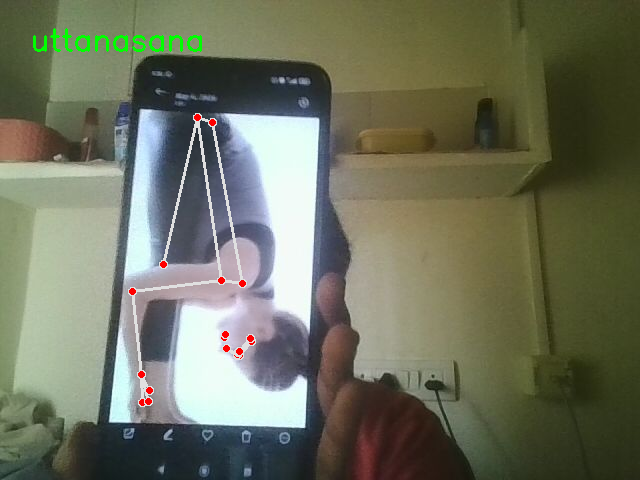

Press ENTER to capture again or type 'q' to quit: 

📸 Capturing image... (allow camera)


<IPython.core.display.Javascript object>

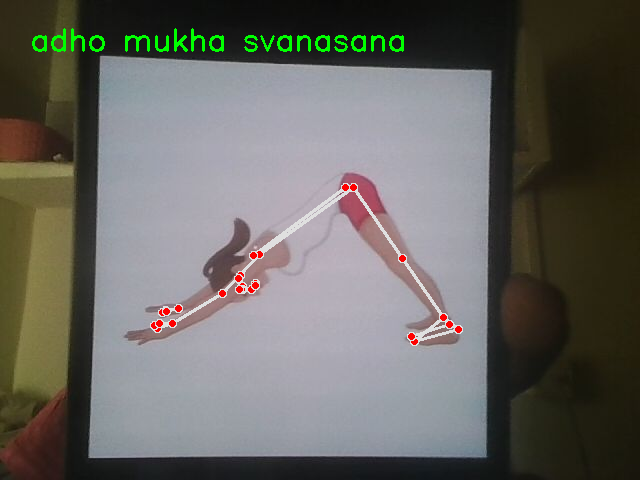

Press ENTER to capture again or type 'q' to quit: 

📸 Capturing image... (allow camera)


<IPython.core.display.Javascript object>

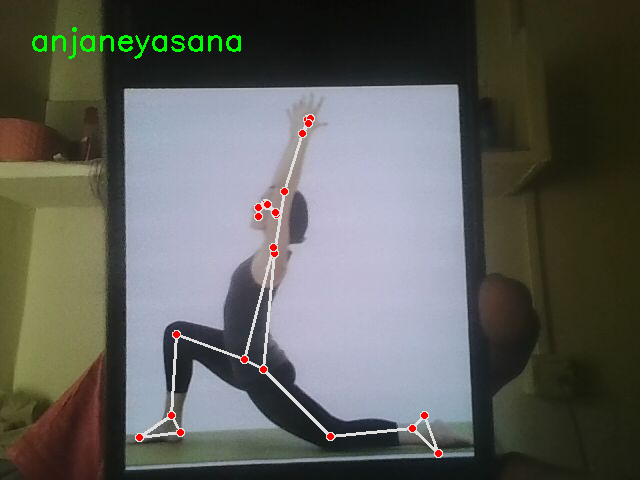

Press ENTER to capture again or type 'q' to quit: 

📸 Capturing image... (allow camera)


<IPython.core.display.Javascript object>

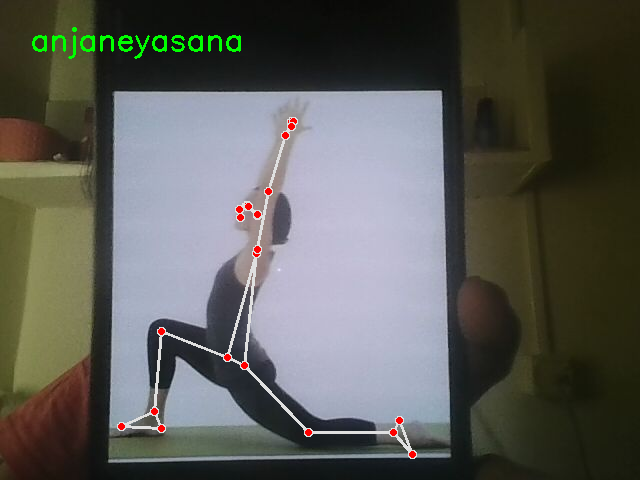

Press ENTER to capture again or type 'q' to quit: 

📸 Capturing image... (allow camera)


<IPython.core.display.Javascript object>

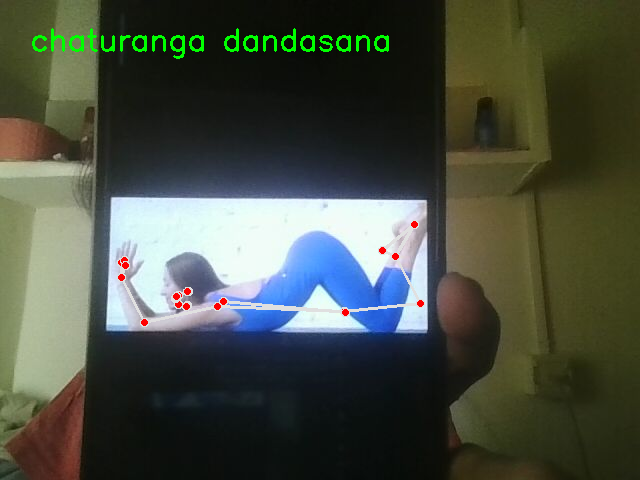

Press ENTER to capture again or type 'q' to quit: 

📸 Capturing image... (allow camera)


<IPython.core.display.Javascript object>

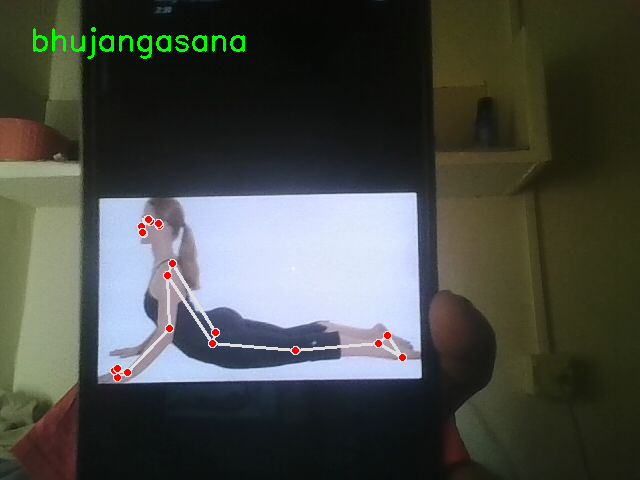

Press ENTER to capture again or type 'q' to quit: 

📸 Capturing image... (allow camera)


<IPython.core.display.Javascript object>

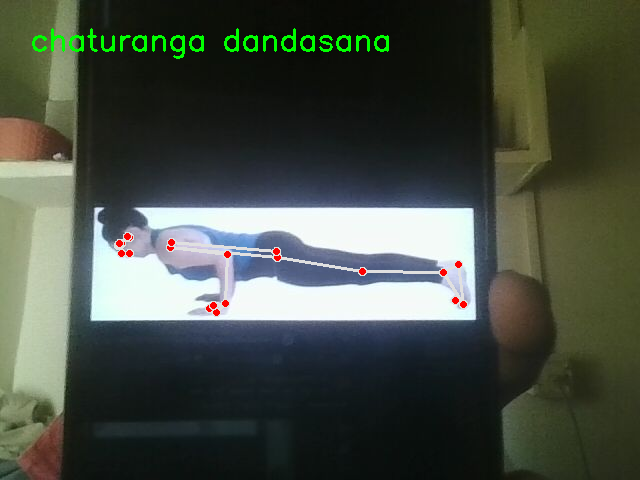

Press ENTER to capture again or type 'q' to quit: 

📸 Capturing image... (allow camera)


<IPython.core.display.Javascript object>

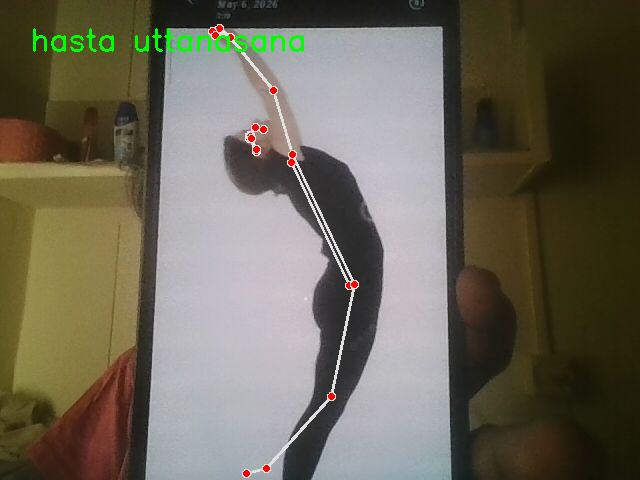

Press ENTER to capture again or type 'q' to quit: 

📸 Capturing image... (allow camera)


<IPython.core.display.Javascript object>

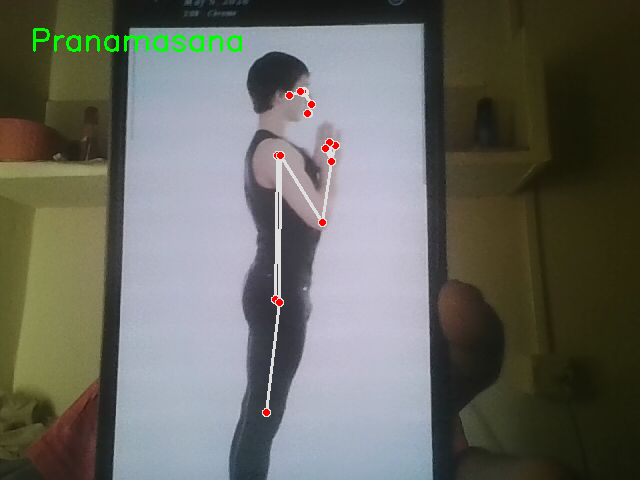

Press ENTER to capture again or type 'q' to quit: q


In [103]:
from google.colab.patches import cv2_imshow
pose = mp_pose.Pose(static_image_mode=True)
#processing the webcam img
while True:
    print("\n📸 Capturing image... (allow camera)")
    frame = take_photo()
#just like before img is prcessed for prediction
    rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    results = pose.process(rgb)
    label = "No Pose"
    if results.pose_landmarks:
        landmarks = results.pose_landmarks.landmark
#extract features
        features = extract_features(landmarks)
#predict pose label
        pred = model.predict([features])[0]
        label = le.inverse_transform([pred])[0]

        mp.solutions.drawing_utils.draw_landmarks(
            frame,
            results.pose_landmarks,
            mp_pose.POSE_CONNECTIONS
        )

    cv2.putText(frame, label, (30, 50),
                cv2.FONT_HERSHEY_SIMPLEX,
                1, (0, 255, 0), 2)

    cv2_imshow(frame)
#ENTER to ocntibue or Q for quit
    cont = input("Press ENTER to capture again or type 'q' to quit: ")
    if cont.lower() == 'q':
        break

In [12]:
from google.colab import files

def upload_image():
    uploaded = files.upload()
    return list(uploaded.keys())

#### MANUALLY UPLOADED PICTURE

In [14]:
def run_upload_test():
    files_list = upload_image()

    with mp_pose.Pose(static_image_mode=True) as pose:
        for filename in files_list:
#collect img from the upload section
            print("\n Image:", filename)
            image = cv2.imread(filename)
#read the image like before
            if image is None:
                print("❌ Could not read image")
                continue
            rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            results = pose.process(rgb)
            label = "No Pose"
#predicting label pose
            if results.pose_landmarks:
                landmarks = results.pose_landmarks.landmark
                features = extract_features(landmarks)
                pred = model.predict([features])[0]
                label = le.inverse_transform([pred])[0]
                probs = model.predict_proba([features])[0]
                confidence = np.max(probs)

                print(f"✅ Prediction: {label} ({confidence:.2f})")
                mp.solutions.drawing_utils.draw_landmarks(
                    image,
                    results.pose_landmarks,
                    mp_pose.POSE_CONNECTIONS
                )

            else:
                print("❌ No pose detected")
            cv2.putText(image, label, (30, 50),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        1, (0, 255, 0), 2)

            cv2_imshow(image)

Saving images (2).jpeg to images (2).jpeg

📂 Image: images (2).jpeg
❌ No pose detected


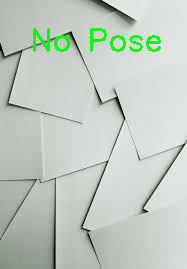

In [20]:
run_upload_test()

## SEQUENCE DETECTION

In [43]:
import cv2
import mediapipe as mp
import joblib

mp_pose = mp.solutions.pose
model = joblib.load("pose_model.pkl")
le = joblib.load("label_encoder.pkl")
def predict_pose(frame):
    """
    Takes a BGR frame → returns pose label or 'No Pose'
    Uses SAME pipeline as training
    """
    rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    with mp_pose.Pose(static_image_mode=True,
                      min_detection_confidence=0.5) as pose:
        results = pose.process(rgb)

    if not results.pose_landmarks:
        return "No Pose"
#HELPS FOR SEQ PREDICTION
    landmarks = results.pose_landmarks.landmark

    try:
        features = extract_features(landmarks)
        pred = model.predict([features])[0]
        label = le.inverse_transform([pred])[0]
        #  optional confidence filter
        probs = model.predict_proba([features])[0]
        confidence = np.max(probs)

        if confidence < 0.6:
            return "No Pose"

        return label

    except:
        return "No Pose"

In [81]:
# =============================================
# SEQUENCE ENGINE
# =============================================
SURYA_SEQUENCE = [
    "pranamasana",
    "hastauttanasana",
    "uttanasana",
    "anjaneyasana",
    "chaturangadandasana",
    "ashtanganamaskara",
    "bhujangasana",
    "adhomukhasvanasana",
    "anjaneyasana",
    "uttanasana",
    "hastauttanasana",
    "pranamasana",
]

POSE_HINTS = {
    "pranamasana": "Stand straight, hands joined in prayer at chest",
    "hastauttanasana": "Raise arms overhead, slight backbend",
    "uttanasana": "Bend forward, touch feet",
    "anjaneyasana": "One leg back, front knee bent, look forward",
    "chaturangadandasana": "Body straight, low plank position",
    "ashtanganamaskara": "Knees, chest, chin touching ground",
    "bhujangasana": "Lift chest up, elbows slightly bent",
    "adhomukhasvanasana": "Inverted V shape, hips up"
}
# tolerate small confusion
SIMILAR_POSES = {
    "uttanasana": ["anjaneyasana"],
    "anjaneyasana": ["uttanasana"],
    "bhujangasana": ["ashtangaNamaskara"],
    "ashtangaNamaskara": ["bhujangasana"]
}

REQUIRED_HOLD_FRAMES = 1

_state = {
    "current_step": 0,
    "rep_count": 0,
    "last_seen_pose": None,
    "hold_counter": 0,
    "status": "waiting",
}
#reset after full round of surya namaskar
def reset_state():
    _state["current_step"] = 0
    _state["rep_count"] = 0
    _state["last_seen_pose"] = None
    _state["hold_counter"] = 0
    _state["status"] = "waiting"
    print(" Sequence reset.")

#output for img
def _build_output():
    return {
        "current_step": _state["current_step"] + 1,
        "total_steps": len(SURYA_SEQUENCE),
        "rep_count": _state["rep_count"],
        "expected_pose": SURYA_SEQUENCE[_state["current_step"]],
        "status": _state["status"],
    }


def update_sequence(pose_label):
#normalization of landmarks
    pose_label = pose_label.strip().lower().replace(" ", "")

    # hold filter
    if pose_label == _state["last_seen_pose"]:
        _state["hold_counter"] += 1
    else:
        _state["last_seen_pose"] = pose_label
        _state["hold_counter"] = 1

    if _state["hold_counter"] < REQUIRED_HOLD_FRAMES:
        return _build_output()

    # if no pose ignore it
    if pose_label == "nopose":
        _state["status"] = "waiting"
        return _build_output()

    expected = SURYA_SEQUENCE[_state["current_step"]]

    # for correct pose continue with inc in step
    if pose_label == expected:

        _state["status"] = "correct"

        # after last pranamasana , go to starting with rep +1
        if _state["current_step"] == len(SURYA_SEQUENCE) - 1:
            _state["rep_count"] += 1
            _state["current_step"] = 0

            print(f"\n Rep {_state['rep_count']} completed!")
            print(" Restarting sequence → Next: Pranamasana")
        else:
            _state["current_step"] += 1
            next_pose = SURYA_SEQUENCE[_state["current_step"]]

            print(f"\n✅ Correct: {pose_label}")
            print(f" Step {_state['current_step']}/{len(SURYA_SEQUENCE)}")
            print(f" Next Pose: {next_pose}")

    # for wrong pose, suggest what is next pose and how to do , hint also there
    else:
        _state["status"] = "wrong_pose"
        print("\n❌ Wrong Pose Detected!")
        print(f" You did: {pose_label}")
        print(f"✅ Expected: {expected}")

        if expected in POSE_HINTS:
            print(f" Hint: {POSE_HINTS[expected]}")
    return _build_output()

## FORM CHECK

In [82]:
def check_form(pose_label, landmarks):
    feedback = []
#to give feedback if pose is not crct
    def pt(i):
        return [landmarks[i].x, landmarks[i].y]
#calc of imp joint angles
    left_elbow  = calculate_angle(pt(11), pt(13), pt(15))
    right_elbow = calculate_angle(pt(12), pt(14), pt(16))

    left_knee  = calculate_angle(pt(23), pt(25), pt(27))
    right_knee = calculate_angle(pt(24), pt(26), pt(28))
    # calc of body positions
    nose_y = landmarks[0].y
    shoulder_y = (landmarks[11].y + landmarks[12].y) / 2
    hip_y = (landmarks[23].y + landmarks[24].y) / 2

    # POSE WISE RULES

    #  Pranamasana
    if pose_label == "pranamasana":
        if abs(landmarks[15].x - landmarks[16].x) > 0.1:
            feedback.append("Bring hands together at chest")

    #  Hasta Uttanasana
    elif pose_label == "hastauttanasana":
        if nose_y > shoulder_y:
            feedback.append("Lift chest and look upward")
        if left_elbow < 150 or right_elbow < 150:
            feedback.append("Keep arms straight")

    # Padahastasana
    elif pose_label == "uttanasana":
        if left_knee < 160 or right_knee < 160:
            feedback.append("Keep knees straight")
        if nose_y < hip_y:
            feedback.append("Bend deeper toward feet")

    #  Ashwa Sanchalanasana
    elif pose_label == "ashwasanchalanasana":
        if abs(left_knee - right_knee) < 30:
            feedback.append("One leg should be forward, one back")
        if nose_y > shoulder_y:
            feedback.append("Look forward, chest open")

    #  Chaturanga
    elif pose_label == "chaturangadandasana":
        if left_elbow > 120:
            feedback.append("Lower body more (bend elbows)")
        if abs(shoulder_y - hip_y) > 0.1:
            feedback.append("Keep body in straight line")

    #  Ashtanga Namaskara
    elif pose_label == "ashtanganamaskara":
        if hip_y < shoulder_y:
            feedback.append("Keep hips slightly raised")

    #  Bhujangasana
    elif pose_label == "bhujangasana":
        if left_elbow > 170 or right_elbow > 170:
            feedback.append("Keep elbows slightly bent")
        if nose_y > shoulder_y:
            feedback.append("Lift chest upward")

    #  Adho Mukha Svanasana
    elif pose_label == "adhomukhasvanasana":
        if hip_y > shoulder_y:
            feedback.append("Lift hips higher")
        if left_knee < 150 or right_knee < 150:
            feedback.append("Try to straighten legs")

  #feedback result

    if len(feedback) == 0:
        return ["✔ Correct form"]

    return feedback

In [83]:
def predict_pose(frame):
    rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
#same code as pose estimation , to predict pose
    with mp_pose.Pose(static_image_mode=True,
                      min_detection_confidence=0.5) as pose:
        results = pose.process(rgb)
    if not results.pose_landmarks:
        return "No Pose", None
#landmark extract for features
    landmarks = results.pose_landmarks.landmark

    try:
        features = extract_features(landmarks)
        pred = model.predict([features])[0]
        label = le.inverse_transform([pred])[0]
#predict label
        label = label.strip().lower().replace(" ", "")
        return label, landmarks
    except:
        return "No Pose", None

In [84]:
def run_sequence_on_images():
    from google.colab import files
#to run sequence detection for uploaded imgs
    while True:
        print("\n Upload next image (or type 'q' to stop)...")
#ENTER TO ADD MORE IMGS AND q TO QUIT
        user_input = input("Press ENTER to upload OR type q to quit: ")
        if user_input.lower() == 'q':
            print(" Stopped.")
            break
        uploaded = files.upload()
        for filename in uploaded.keys():
            frame = cv2.imread(filename)
            pose_label, landmarks = predict_pose(frame)
            seq_info = update_sequence(pose_label)
#calling the results and printing them
            print("\n", filename)
            print("Pose:", pose_label)
            print("Reps:", seq_info["rep_count"])
            print("Status:", seq_info["status"])

            # form check
            if (
                landmarks is not None and
                pose_label != "nopose" and
                seq_info["status"] == "correct"
            ):
                form_feedback = check_form(pose_label, landmarks)
                print("Form Check:")
                for f in form_feedback:
                    print(" -", f)
            # label predicyion
            cv2.putText(frame, pose_label, (30, 50),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        1, (0, 255, 0), 2)

            cv2_imshow(frame)

 Sequence reset.

 Upload next image (or type 'q' to stop)...
Press ENTER to upload OR type q to quit: 


Saving 46-0.png to 46-0 (5).png

❌ Wrong Pose Detected!
 You did: uttanasana
✅ Expected: pranamasana
 Hint: Stand straight, hands joined in prayer at chest

 46-0 (5).png
Pose: uttanasana
Reps: 0
Status: wrong_pose


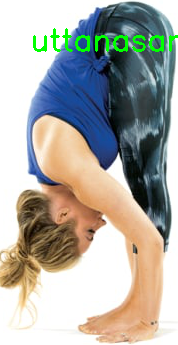


 Upload next image (or type 'q' to stop)...
Press ENTER to upload OR type q to quit: 


Saving Screenshot from 2026-05-06 01-35-17.png to Screenshot from 2026-05-06 01-35-17 (5).png

✅ Correct: pranamasana
 Step 1/12
 Next Pose: hastauttanasana

 Screenshot from 2026-05-06 01-35-17 (5).png
Pose: pranamasana
Reps: 0
Status: correct
Form Check:
 - ✔ Correct form


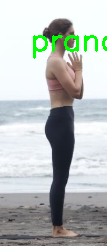


 Upload next image (or type 'q' to stop)...
Press ENTER to upload OR type q to quit: 


Saving Screenshot from 2026-05-06 01-44-46.png to Screenshot from 2026-05-06 01-44-46 (1).png

 Screenshot from 2026-05-06 01-44-46 (1).png
Pose: No Pose
Reps: 0
Status: waiting


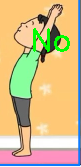


 Upload next image (or type 'q' to stop)...
Press ENTER to upload OR type q to quit: 


Saving Screenshot from 2026-05-06 01-40-44.png to Screenshot from 2026-05-06 01-40-44.png

✅ Correct: hastauttanasana
 Step 2/12
 Next Pose: uttanasana

 Screenshot from 2026-05-06 01-40-44.png
Pose: hastauttanasana
Reps: 0
Status: correct
Form Check:
 - ✔ Correct form


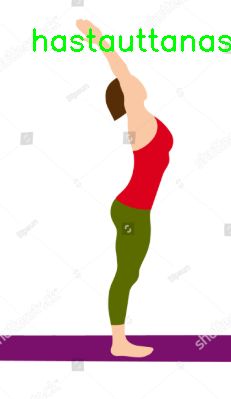


 Upload next image (or type 'q' to stop)...
Press ENTER to upload OR type q to quit: 


Saving 46-0.png to 46-0 (6).png

✅ Correct: uttanasana
 Step 3/12
 Next Pose: anjaneyasana

 46-0 (6).png
Pose: uttanasana
Reps: 0
Status: correct
Form Check:
 - ✔ Correct form


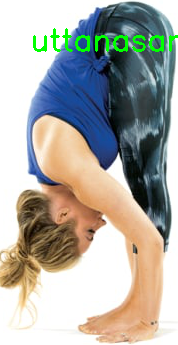


 Upload next image (or type 'q' to stop)...
Press ENTER to upload OR type q to quit: 


Saving 35-0.png to 35-0.png

✅ Correct: anjaneyasana
 Step 4/12
 Next Pose: chaturangadandasana

 35-0.png
Pose: anjaneyasana
Reps: 0
Status: correct
Form Check:
 - ✔ Correct form


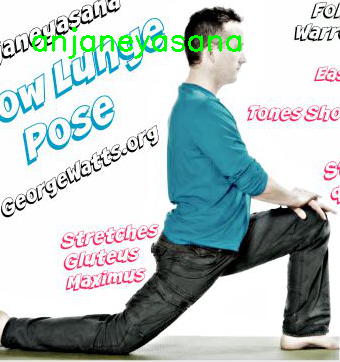


 Upload next image (or type 'q' to stop)...
Press ENTER to upload OR type q to quit: 


Saving 24-0.png to 24-0.png

✅ Correct: chaturangadandasana
 Step 5/12
 Next Pose: ashtanganamaskara

 24-0.png
Pose: chaturangadandasana
Reps: 0
Status: correct
Form Check:
 - Keep body in straight line


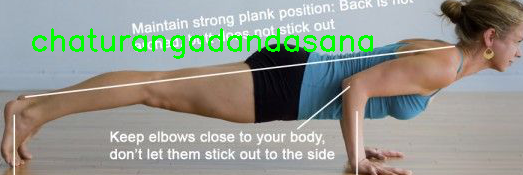


 Upload next image (or type 'q' to stop)...
Press ENTER to upload OR type q to quit: 


Saving 58-0.png to 58-0 (5).png

✅ Correct: ashtanganamaskara
 Step 6/12
 Next Pose: bhujangasana

 58-0 (5).png
Pose: ashtanganamaskara
Reps: 0
Status: correct
Form Check:
 - Keep hips slightly raised


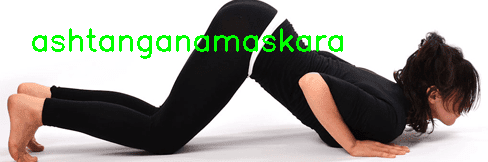


 Upload next image (or type 'q' to stop)...
Press ENTER to upload OR type q to quit: 


Saving 78-0.png to 78-0 (2).png

✅ Correct: bhujangasana
 Step 7/12
 Next Pose: adhomukhasvanasana

 78-0 (2).png
Pose: bhujangasana
Reps: 0
Status: correct
Form Check:
 - ✔ Correct form


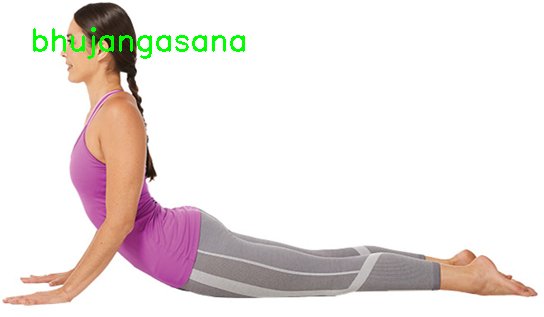


 Upload next image (or type 'q' to stop)...
Press ENTER to upload OR type q to quit: 


Saving 51. screenshot_20180409-154224.png to 51. screenshot_20180409-154224.png

✅ Correct: adhomukhasvanasana
 Step 8/12
 Next Pose: anjaneyasana

 51. screenshot_20180409-154224.png
Pose: adhomukhasvanasana
Reps: 0
Status: correct
Form Check:
 - ✔ Correct form


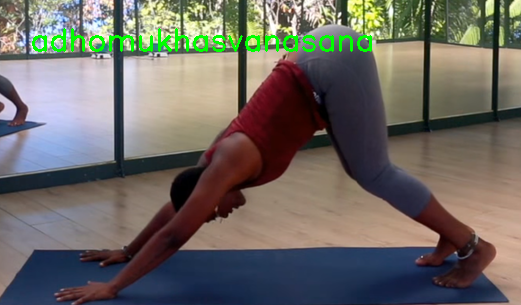


 Upload next image (or type 'q' to stop)...
Press ENTER to upload OR type q to quit: 


Saving 69-0.png to 69-0.png

❌ Wrong Pose Detected!
 You did: uttanasana
✅ Expected: anjaneyasana
 Hint: One leg back, front knee bent, look forward

 69-0.png
Pose: uttanasana
Reps: 0
Status: wrong_pose


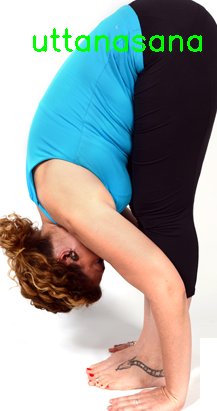


 Upload next image (or type 'q' to stop)...
Press ENTER to upload OR type q to quit: 


Saving 21-0.png to 21-0 (1).png

✅ Correct: anjaneyasana
 Step 9/12
 Next Pose: uttanasana

 21-0 (1).png
Pose: anjaneyasana
Reps: 0
Status: correct
Form Check:
 - ✔ Correct form


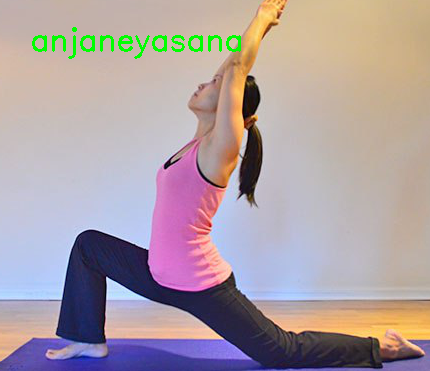


 Upload next image (or type 'q' to stop)...
Press ENTER to upload OR type q to quit: 


Saving 29-0.png to 29-0.png

✅ Correct: uttanasana
 Step 10/12
 Next Pose: hastauttanasana

 29-0.png
Pose: uttanasana
Reps: 0
Status: correct
Form Check:
 - Keep knees straight


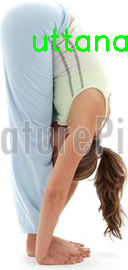


 Upload next image (or type 'q' to stop)...
Press ENTER to upload OR type q to quit: 


Saving Screenshot from 2026-05-06 01-45-04.png to Screenshot from 2026-05-06 01-45-04.png

✅ Correct: hastauttanasana
 Step 11/12
 Next Pose: pranamasana

 Screenshot from 2026-05-06 01-45-04.png
Pose: hastauttanasana
Reps: 0
Status: correct
Form Check:
 - ✔ Correct form


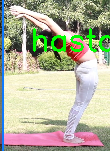


 Upload next image (or type 'q' to stop)...
Press ENTER to upload OR type q to quit: 


Saving Screenshot from 2026-05-06 01-33-31.png to Screenshot from 2026-05-06 01-33-31.png

 Rep 1 completed!
 Restarting sequence → Next: Pranamasana

 Screenshot from 2026-05-06 01-33-31.png
Pose: pranamasana
Reps: 1
Status: correct
Form Check:
 - ✔ Correct form


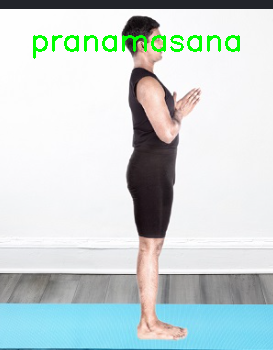


 Upload next image (or type 'q' to stop)...
Press ENTER to upload OR type q to quit: 


Saving Screenshot from 2026-05-06 01-43-03.png to Screenshot from 2026-05-06 01-43-03.png

❌ Wrong Pose Detected!
 You did: hastauttanasana
✅ Expected: pranamasana
 Hint: Stand straight, hands joined in prayer at chest

 Screenshot from 2026-05-06 01-43-03.png
Pose: hastauttanasana
Reps: 1
Status: wrong_pose


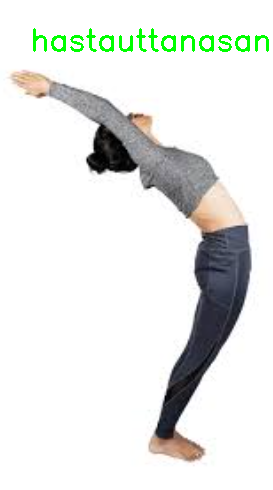


 Upload next image (or type 'q' to stop)...
Press ENTER to upload OR type q to quit: 


Saving Screenshot from 2026-05-06 01-33-31.png to Screenshot from 2026-05-06 01-33-31 (1).png

✅ Correct: pranamasana
 Step 1/12
 Next Pose: hastauttanasana

 Screenshot from 2026-05-06 01-33-31 (1).png
Pose: pranamasana
Reps: 1
Status: correct
Form Check:
 - ✔ Correct form


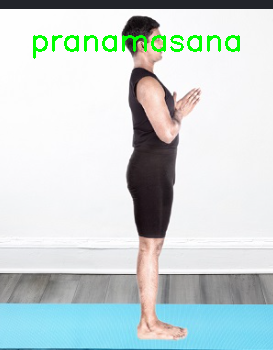


 Upload next image (or type 'q' to stop)...
Press ENTER to upload OR type q to quit: q
 Stopped.


In [85]:
reset_state()
run_sequence_on_images()

#### SEQ DETECTION FOR WEBCAMERA

In [93]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
import base64
import cv2
import numpy as np
#webcam code took from gpt for colab sake
def take_photo():
    js = Javascript('''
    async function takePhoto() {
      const video = document.createElement('video');
      const stream = await navigator.mediaDevices.getUserMedia({video: true});
      video.srcObject = stream;
      await video.play();

      await new Promise(resolve => setTimeout(resolve, 2000));

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);

      stream.getTracks().forEach(track => track.stop());

      return canvas.toDataURL('image/jpeg');
    }
    takePhoto();
    ''')

    display(js)
    data = eval_js("takePhoto()")

    binary = base64.b64decode(data.split(',')[1])
    img = np.frombuffer(binary, dtype=np.uint8)
    frame = cv2.imdecode(img, cv2.IMREAD_COLOR)

    return frame

In [94]:
from google.colab.patches import cv2_imshow

def run_webcam_step_mode():
    print(" Press ENTER to capture | q to quit\n")
#prev code from uploaded image is used here
    while True:
        user_input = input("Press ENTER or q: ")

        if user_input.lower() == 'q':
            print(" Stopped")
            break

        frame = take_photo()
        pose_label, landmarks = predict_pose(frame)
        seq_info = update_sequence(pose_label)
        #results extracted and printed below
        print("\nPose:", pose_label)
        print("Expected:", seq_info["expected_pose"])
        print("Step:", seq_info["current_step"], "/", seq_info["total_steps"])
        print("Reps:", seq_info["rep_count"])
        print("Status:", seq_info["status"])
        if seq_info["status"] == "correct" and landmarks is not None:
            feedback = check_form(pose_label, landmarks)
            print("Form Check:")
            for f in feedback:
                print(" -", f)
        cv2.putText(frame, pose_label, (30, 50),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    1, (0, 255, 0), 2)
        cv2_imshow(frame)

 Sequence reset.
📸 Press ENTER to capture | q to quit

Press ENTER or q: 


<IPython.core.display.Javascript object>


❌ Wrong Pose Detected!
 You did: adhomukhasvanasana
✅ Expected: pranamasana
 Hint: Stand straight, hands joined in prayer at chest

Pose: adhomukhasvanasana
Expected: pranamasana
Step: 1 / 12
Reps: 0
Status: wrong_pose


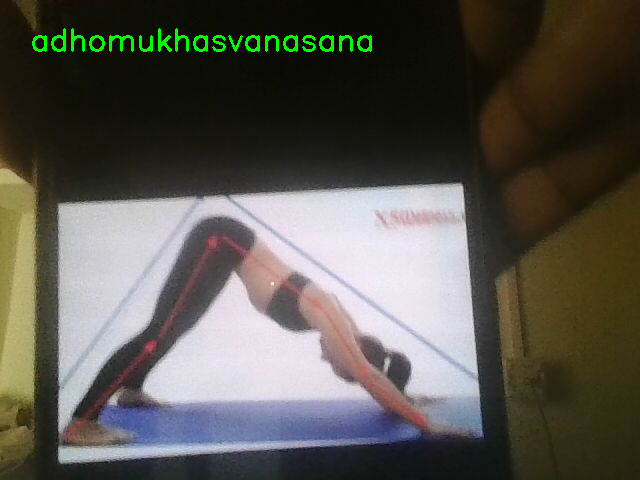

Press ENTER or q: 


<IPython.core.display.Javascript object>


✅ Correct: pranamasana
 Step 1/12
 Next Pose: hastauttanasana

Pose: pranamasana
Expected: hastauttanasana
Step: 2 / 12
Reps: 0
Status: correct
Form Check:
 - ✔ Correct form


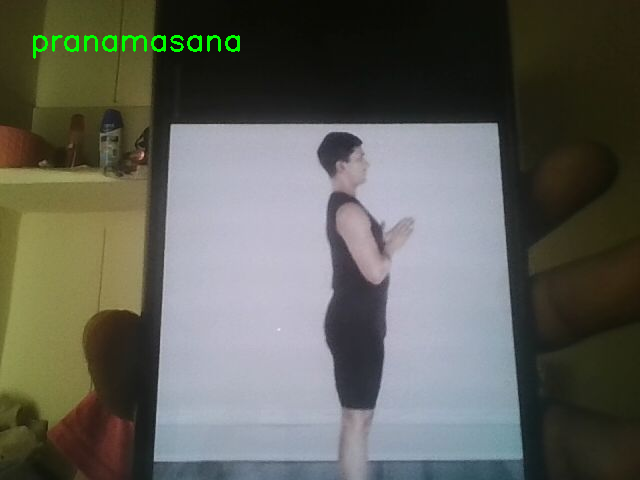

Press ENTER or q: 


<IPython.core.display.Javascript object>


✅ Correct: hastauttanasana
 Step 2/12
 Next Pose: uttanasana

Pose: hastauttanasana
Expected: uttanasana
Step: 3 / 12
Reps: 0
Status: correct
Form Check:
 - ✔ Correct form


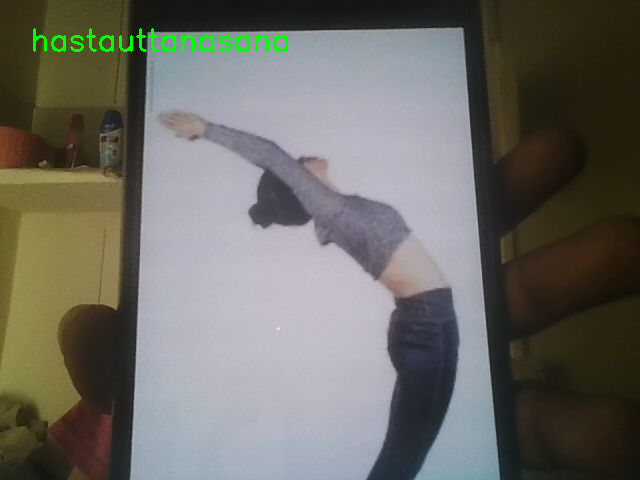

Press ENTER or q: 


<IPython.core.display.Javascript object>


✅ Correct: uttanasana
 Step 3/12
 Next Pose: anjaneyasana

Pose: uttanasana
Expected: anjaneyasana
Step: 4 / 12
Reps: 0
Status: correct
Form Check:
 - Keep knees straight


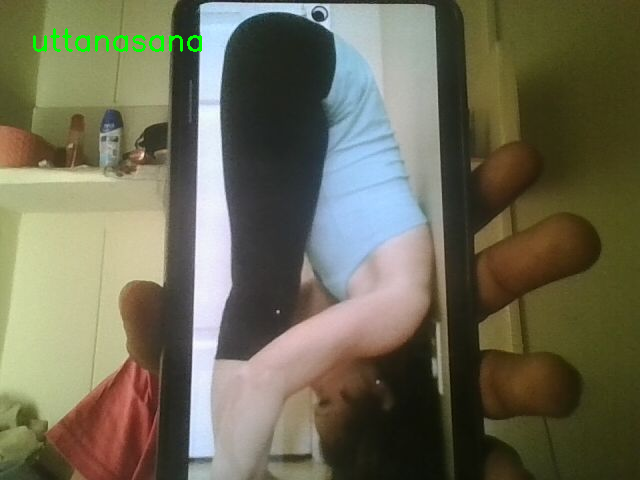

Press ENTER or q: 


<IPython.core.display.Javascript object>


✅ Correct: anjaneyasana
 Step 4/12
 Next Pose: chaturangadandasana

Pose: anjaneyasana
Expected: chaturangadandasana
Step: 5 / 12
Reps: 0
Status: correct
Form Check:
 - ✔ Correct form


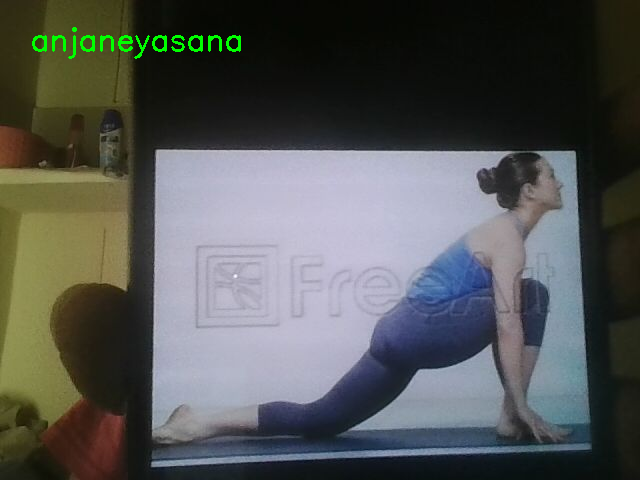

Press ENTER or q: 


<IPython.core.display.Javascript object>


✅ Correct: chaturangadandasana
 Step 5/12
 Next Pose: ashtanganamaskara

Pose: chaturangadandasana
Expected: ashtanganamaskara
Step: 6 / 12
Reps: 0
Status: correct
Form Check:
 - ✔ Correct form


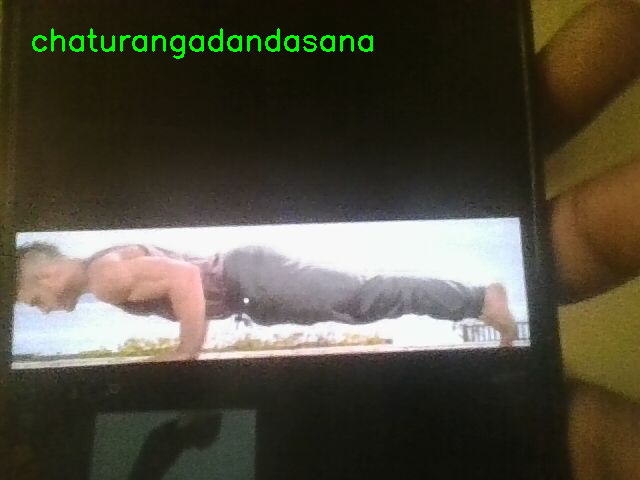

Press ENTER or q: 


<IPython.core.display.Javascript object>


✅ Correct: ashtanganamaskara
 Step 6/12
 Next Pose: bhujangasana

Pose: ashtanganamaskara
Expected: bhujangasana
Step: 7 / 12
Reps: 0
Status: correct
Form Check:
 - Keep hips slightly raised


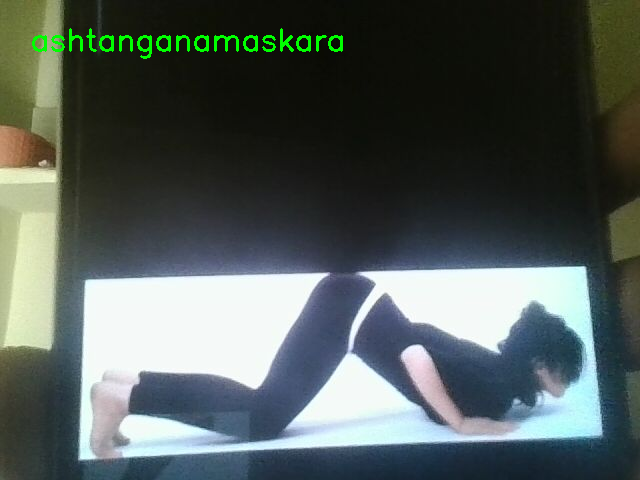

Press ENTER or q: 


<IPython.core.display.Javascript object>


✅ Correct: bhujangasana
 Step 7/12
 Next Pose: adhomukhasvanasana

Pose: bhujangasana
Expected: adhomukhasvanasana
Step: 8 / 12
Reps: 0
Status: correct
Form Check:
 - Keep elbows slightly bent


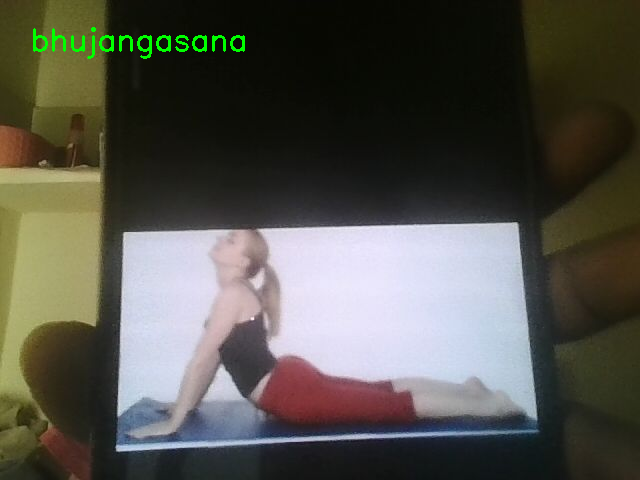

Press ENTER or q: 


<IPython.core.display.Javascript object>


✅ Correct: adhomukhasvanasana
 Step 8/12
 Next Pose: anjaneyasana

Pose: adhomukhasvanasana
Expected: anjaneyasana
Step: 9 / 12
Reps: 0
Status: correct
Form Check:
 - ✔ Correct form


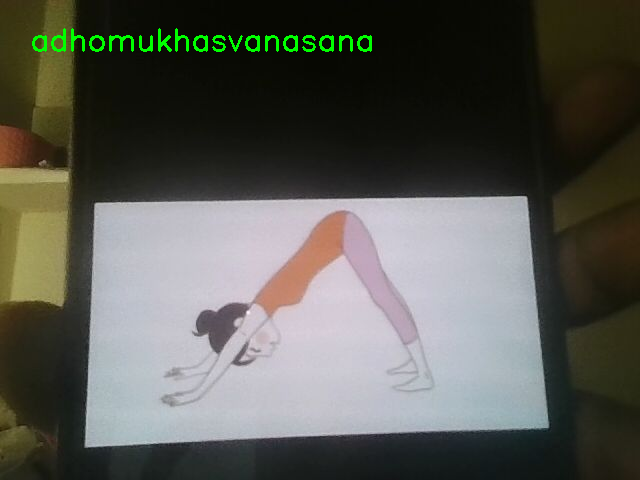

Press ENTER or q: 


<IPython.core.display.Javascript object>


✅ Correct: anjaneyasana
 Step 9/12
 Next Pose: uttanasana

Pose: anjaneyasana
Expected: uttanasana
Step: 10 / 12
Reps: 0
Status: correct
Form Check:
 - ✔ Correct form


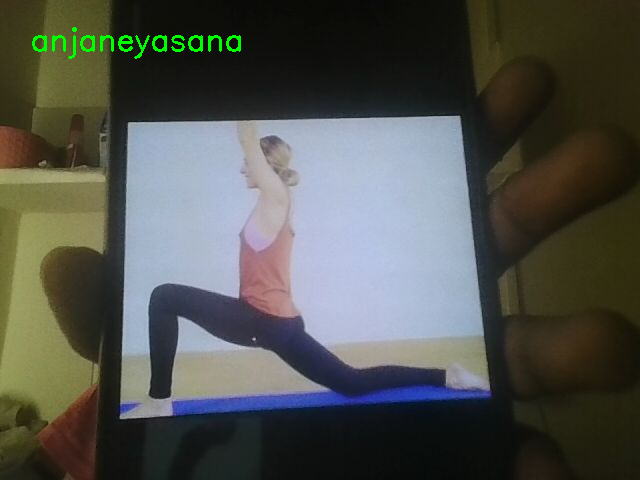

Press ENTER or q: 


<IPython.core.display.Javascript object>


❌ Wrong Pose Detected!
 You did: anjaneyasana
✅ Expected: uttanasana
 Hint: Bend forward, touch feet

Pose: anjaneyasana
Expected: uttanasana
Step: 10 / 12
Reps: 0
Status: wrong_pose


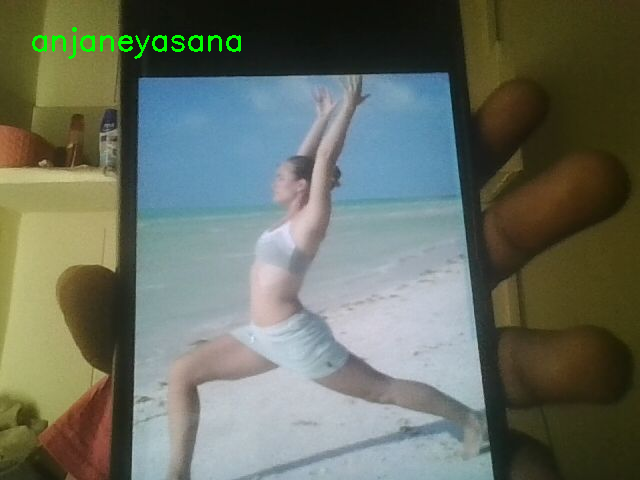

Press ENTER or q: 


<IPython.core.display.Javascript object>


✅ Correct: uttanasana
 Step 10/12
 Next Pose: hastauttanasana

Pose: uttanasana
Expected: hastauttanasana
Step: 11 / 12
Reps: 0
Status: correct
Form Check:
 - ✔ Correct form


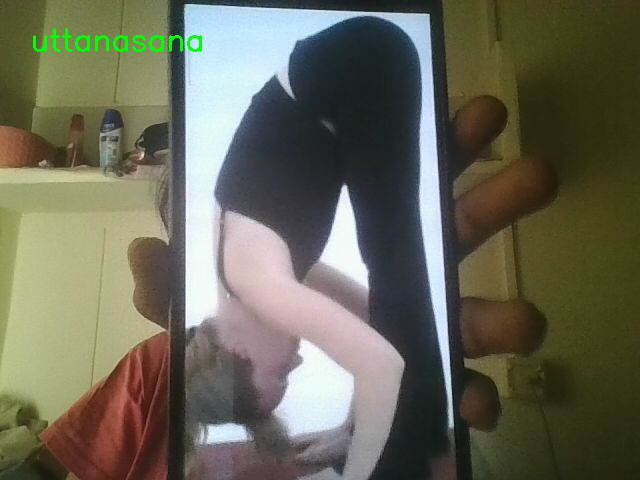

Press ENTER or q: 


<IPython.core.display.Javascript object>


✅ Correct: hastauttanasana
 Step 11/12
 Next Pose: pranamasana

Pose: hastauttanasana
Expected: pranamasana
Step: 12 / 12
Reps: 0
Status: correct
Form Check:
 - ✔ Correct form


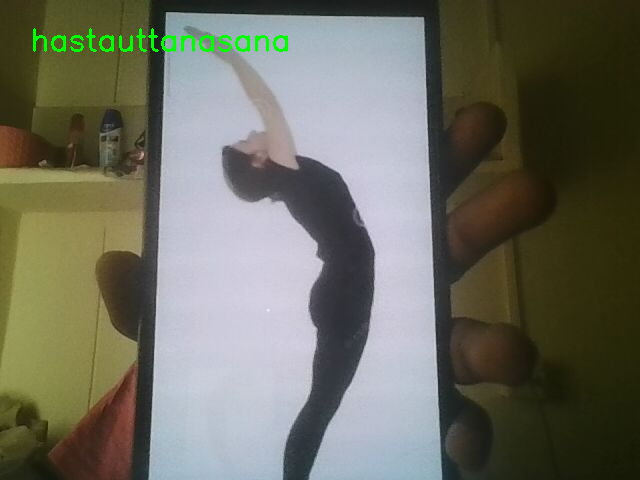

Press ENTER or q: 


<IPython.core.display.Javascript object>


 Rep 1 completed!
 Restarting sequence → Next: Pranamasana

Pose: pranamasana
Expected: pranamasana
Step: 1 / 12
Reps: 1
Status: correct
Form Check:
 - ✔ Correct form


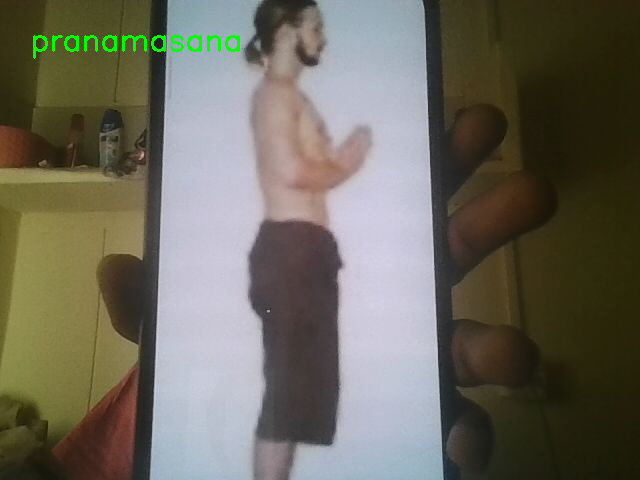

Press ENTER or q: 


<IPython.core.display.Javascript object>


Pose: No Pose
Expected: pranamasana
Step: 1 / 12
Reps: 1
Status: waiting


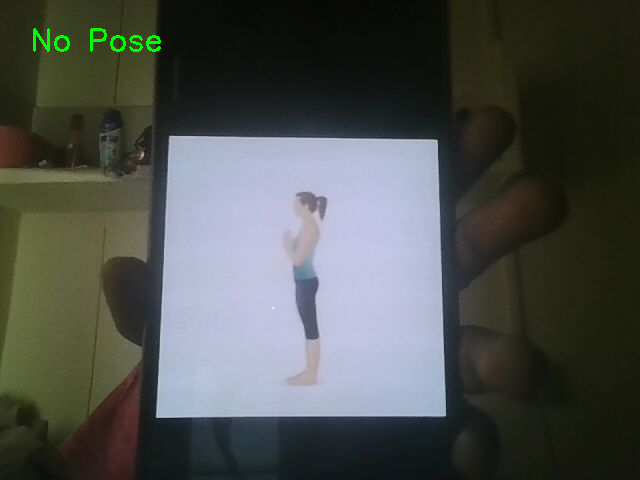

Press ENTER or q: 


<IPython.core.display.Javascript object>


✅ Correct: pranamasana
 Step 1/12
 Next Pose: hastauttanasana

Pose: pranamasana
Expected: hastauttanasana
Step: 2 / 12
Reps: 1
Status: correct
Form Check:
 - ✔ Correct form


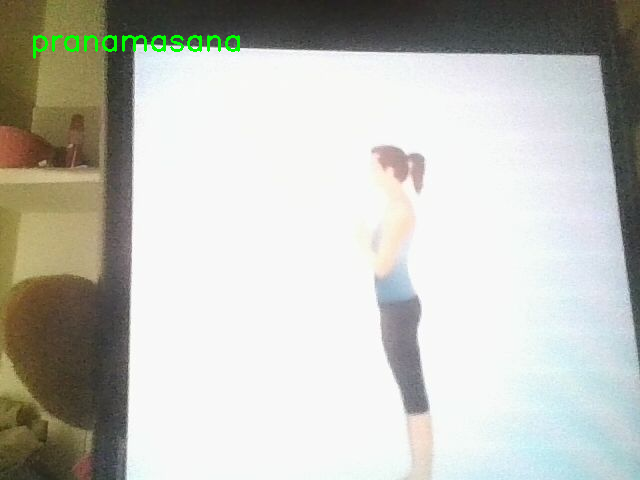

Press ENTER or q: q
🛑 Stopped


In [108]:
reset_state()
run_webcam_step_mode()

This system  detects Surya Namaskar poses from uploaded images and webcam input using Mediapipe based pose keypoint extraction and machine learning based pose classification. The system can track the full 12 step Surya Namaskar sequence, count repetitions, identifyincorrect pose order, and provide nextstep guidance. I also ha srule based form correction feedback, which was implemented using joint-angle and body position analysis to identify posture mistakes such as bent knees or incorrect elbow alignment, etc. The use of normalized pose keypoints along with angle based geometric features improved prediction stability and pose recognition performance across different users and camera positions.